In [1]:
#Importing the required packages
import pandas as pd
import matplotlib.pyplot as plt
from fbprophet import Prophet
import bar_chart_race as bcr
import warnings
%matplotlib inline
warnings.simplefilter('ignore')

In [2]:
#Read the dataset
df=pd.read_csv('COVID-19-geographic-disbtribution-worldwide.csv')
df.head(10)

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2019,continentExp,Cumulative_number_for_14_days_of_COVID-19_cases_per_100000
0,8/26/2020,26,8,2020,1,0,Afghanistan,AF,AFG,38041757.0,Asia,2.108210
1,8/25/2020,25,8,2020,71,10,Afghanistan,AF,AFG,38041757.0,Asia,2.670749
2,8/24/2020,24,8,2020,0,0,Afghanistan,AF,AFG,38041757.0,Asia,2.484112
3,8/23/2020,23,8,2020,105,2,Afghanistan,AF,AFG,38041757.0,Asia,2.484112
4,8/22/2020,22,8,2020,38,0,Afghanistan,AF,AFG,38041757.0,Asia,2.310619
5,8/21/2020,21,8,2020,97,2,Afghanistan,AF,AFG,38041757.0,Asia,2.415766
6,8/20/2020,20,8,2020,160,8,Afghanistan,AF,AFG,38041757.0,Asia,2.268560
7,8/19/2020,19,8,2020,0,0,Afghanistan,AF,AFG,38041757.0,Asia,2.024092
8,8/18/2020,18,8,2020,3,0,Afghanistan,AF,AFG,38041757.0,Asia,2.239644
9,8/17/2020,17,8,2020,45,5,Afghanistan,AF,AFG,38041757.0,Asia,2.329020


# covid-19 spread in the world

In [3]:
#Creating a pivot_table for the global corona spread.
pivot=pd.pivot_table(df,values='cases',columns='countriesAndTerritories',index='dateRep',aggfunc='sum',fill_value=0)

#Getting the cumulative sum of cases
pivot=pivot.expanding().sum()

#Converting the index to datetime
pivot.index=pd.to_datetime(pivot.index)
pivot.tail()

countriesAndTerritories,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua_and_Barbuda,Argentina,Armenia,Aruba,...,United_States_Virgin_Islands,United_States_of_America,Uruguay,Uzbekistan,Venezuela,Vietnam,Western_Sahara,Yemen,Zambia,Zimbabwe
dateRep,,,,,,,,,,,,,,,,,,,,,
2020-08-05,37846.0,8234.0,40039.0,1043.0,1903.0,3.0,94.0,330691.0,42049.0,1293.0,...,946.0,5552098.0,1501.0,36907.0,38430.0,889.0,766.0,1884.0,9962.0,5842.0
2020-08-06,37913.0,8373.0,40590.0,1043.0,2083.0,3.0,94.0,337483.0,42337.0,1332.0,...,984.0,5604902.0,1510.0,37662.0,39291.0,934.0,766.0,1888.0,10404.0,5960.0
2020-08-07,37954.0,8500.0,41161.0,1048.0,2134.0,3.0,94.0,344630.0,42570.0,1424.0,...,1005.0,5664657.0,1519.0,38402.0,40272.0,967.0,766.0,1891.0,10546.0,6016.0
2020-08-08,38032.0,8635.0,41690.0,1059.0,2222.0,3.0,94.0,352143.0,42636.0,1557.0,...,1011.0,5722807.0,1526.0,39052.0,41158.0,1006.0,766.0,1920.0,10868.0,6072.0
2020-08-09,38071.0,8759.0,42228.0,1060.0,2222.0,3.0,94.0,359625.0,42936.0,1670.0,...,1030.0,5779028.0,1536.0,39790.0,41158.0,1029.0,766.0,1924.0,11285.0,6196.0


In [93]:
#Plotting the bar chart race of global corona spread.
bcr.bar_chart_race(pivot,
                   n_bars=5,
                   #filename='covid-19.mp4',
                   bar_size=0.75,
                   orientation='h',
                   sort='desc',
                   figsize=(15,6),
                   title='COVID-19 SPREAD',
                   period_length=800,
                   title_size=20,
                   bar_label_size=15,
                   tick_label_size=15)
                 

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 19.63715277777778 x 6.0 to 19.625 x 6.0
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 2826x864 -pix_fmt rgba -r 12.5 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\user\AppData\Local\Temp\tmpyvtpybvh\temp.m4v'


# covid-19 spread in africa

In [99]:
#Extracting corona dataset for african countries
df_africa=df[df['continentExp']=='Africa']

#Creating a pivot table for the african countries
pivot_africa=pd.pivot_table(df_africa,values='cases',columns='countriesAndTerritories',index='dateRep',aggfunc='sum',fill_value=0)

#Getting the cumulative sum of all confirmed cases
pivot_africa=pivot_africa.expanding().sum()

#Converting the index of the pivot table to datetime
pivot_africa.index=pd.to_datetime(pivot.index)

#Plotting the bar chart race for the african countries
bcr.bar_chart_race(pivot_africa,
                   n_bars=10,
                   #filename='covid-19_africa.mp4',
                   bar_size=0.75,
                   orientation='h',
                   sort='desc',
                   figsize=(15,5),
                   title='COVID-19 SPREAD IN AFRICA',
                   period_length=800,
                   title_size=20,
                   bar_label_size=12,
                   tick_label_size=12)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 2564x720 -pix_fmt rgba -r 1.25 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y 'C:\Users\user\AppData\Local\Temp\tmpgs5lkepl\temp.m4v'


# covid-19 in kenya

In [6]:
#Extracting the Kenyan dataset
data_ke=df[df['countriesAndTerritories']=='Kenya']
data_ke.head()

,dateRep,day,month,year,cases,deaths,countriesAndTerritories,geoId,countryterritoryCode,popData2019,continentExp,Cumulative_number_for_14_days_of_COVID-19_cases_per_100000
19458,8/26/2020,26,8,2020,246,5,Kenya,KE,KEN,52573967.0,Africa,10.229397
19459,8/25/2020,25,8,2020,193,6,Kenya,KE,KEN,52573967.0,Africa,10.706820
19460,8/24/2020,24,8,2020,246,6,Kenya,KE,KEN,52573967.0,Africa,11.275543
19461,8/23/2020,23,8,2020,355,10,Kenya,KE,KEN,52573967.0,Africa,11.946977
19462,8/22/2020,22,8,2020,322,16,Kenya,KE,KEN,52573967.0,Africa,12.601294


In [7]:
#Extract the columns to use i.e 'dateRep','cases'
data=data_ke[['dateRep','cases']]

#convert the 'dateRep' to datetime
data['dateRep']=pd.to_datetime(data['dateRep'])

#setting the dateRep as index
data.set_index('dateRep')

#Checking the head of the dataset
data.head()

,dateRep,cases
19458,2020-08-26,246
19459,2020-08-25,193
19460,2020-08-24,246
19461,2020-08-23,355
19462,2020-08-22,322


Text(0.5, 0, 'Date')

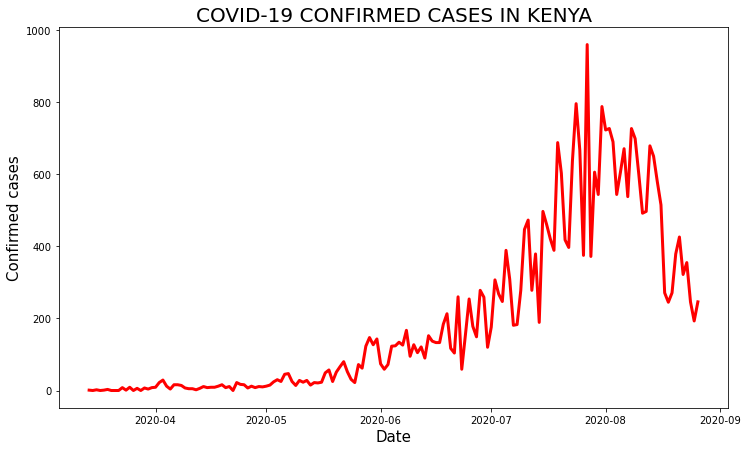

In [8]:
# Line chart of corona cases in Kenya
plt.figure(figsize=(12,7))
plt.plot(data['dateRep'],data['cases'],lw=3,color='red')

#Label the Title
plt.title('COVID-19 CONFIRMED CASES IN KENYA', fontsize=20)

#Labelling the axis
plt.ylabel('Confirmed cases',fontsize=15)
plt.xlabel('Date',fontsize=15)

In [73]:
#Renaming the columns as per fbprophet model
data.columns=['ds','y']

#Initializing the Prophet model
m=Prophet(seasonality_mode='multiplicative',
    seasonality_prior_scale=10,
    holidays_prior_scale=10,
    changepoint_prior_scale=0.50)

#Adding seasonality
m.add_seasonality(name='yearly', period=365, fourier_order=10)

#Fitting the data to the model
m.fit(data)

INFO:fbprophet:Found custom seasonality named 'yearly', disabling built-in 'yearly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [80]:
#making the future dataframe
future=m.make_future_dataframe(periods=15, freq='D')
print(f'shape of future dataframe:{future.shape}')
print(f'shape of train dataframe:{data.shape}')

shape of future dataframe:(181, 1)
shape of train dataframe:(166, 2)


In [81]:
#Forecasting for the next 15 days
forecast=m.predict(future)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2020-03-14,1.102162,-72.839138,75.804159,1.102162,1.102162,-1.851516,-1.851516,-1.851516,0.263957,0.263957,0.263957,-2.115473,-2.115473,-2.115473,0.0,0.0,0.0,-0.938508
1,2020-03-15,1.283332,-62.591136,72.061057,1.283332,1.283332,-1.738245,-1.738245,-1.738245,0.201888,0.201888,0.201888,-1.940133,-1.940133,-1.940133,0.0,0.0,0.0,-0.947414
2,2020-03-16,1.464503,-77.545842,72.063277,1.464503,1.464503,-1.309223,-1.309223,-1.309223,0.444352,0.444352,0.444352,-1.753575,-1.753575,-1.753575,0.0,0.0,0.0,-0.452858
3,2020-03-17,1.645674,-80.069374,68.555229,1.645674,1.645674,-2.743098,-2.743098,-2.743098,-1.184010,-1.184010,-1.184010,-1.559089,-1.559089,-1.559089,0.0,0.0,0.0,-2.868571
4,2020-03-18,1.826844,-77.578264,70.427323,1.826844,1.826844,-1.840547,-1.840547,-1.840547,-0.480481,-0.480481,-0.480481,-1.360066,-1.360066,-1.360066,0.0,0.0,0.0,-1.535549


# checking for trend lines

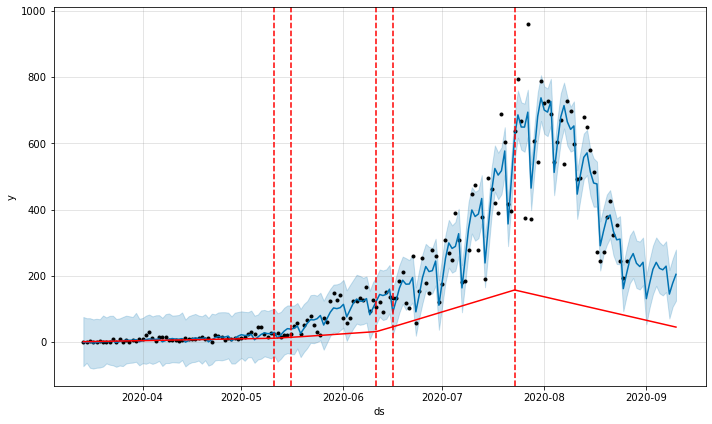

In [82]:
from fbprophet.plot import add_changepoints_to_plot
fig=m.plot(forecast)
a=add_changepoints_to_plot(fig.gca(),m,forecast)

# Plotting the forecast using plotly

In [83]:
#m.plot(forecast);
#m.plot_components(forecast);
from fbprophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

In [84]:
#Plotting the forecast components
plot_components_plotly(m, forecast)

# Visualizing the actual data vs prediction

(737546.0, 737699.0)

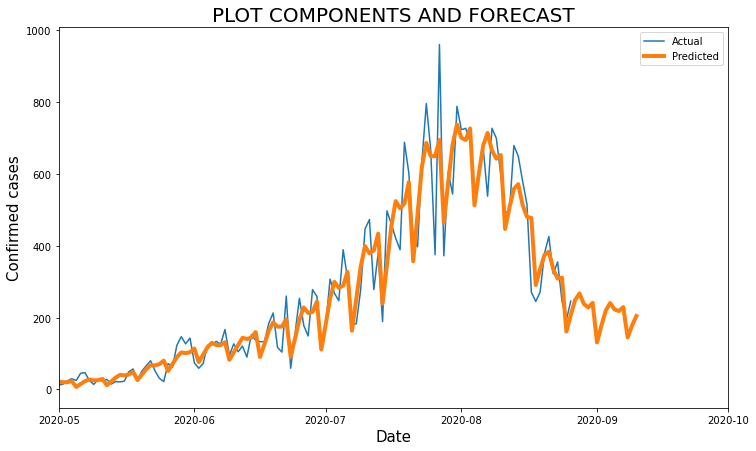

In [85]:
plt.figure(figsize=(12,7))
plt.plot(data['ds'],data['y'],label='Actual')
plt.plot(forecast['ds'],forecast['yhat'],lw=4,label='Predicted')
plt.legend()
plt.title('PLOT COMPONENTS AND FORECAST',fontsize=20)
plt.ylabel('Confirmed cases',fontsize=15)
plt.xlabel('Date',fontsize=15)
plt.xlim(pd.to_datetime('2020-05'),pd.to_datetime('2020-10'))